In [273]:
import pandas as pd
import AnalFunctions as af
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m
import seaborn as sns

path, folder_list, N_runs, b, cross_var, folder_frame, test_str, test_var, test_var2, test_str2, lin_var, T_test_list, sec_test_var, N_ped, fps, mot_frac = af.var_ini()
af.file_writer(path, folder_list, N_runs, b, cross_var, folder_frame, test_str, test_var)

sl = "/"
T_test_list = lin_var[test_var2]
lattice_type = 'jule'
runs_tested = N_runs
traj_testvar2 = []


def dist(x1, y1, x2, y2, x3, y3): # x3,y3 is the point

    px = x2-x1
    py = y2-y1

    norm = px*px + py*py

    u =  ((x3 - x1) * px + (y3 - y1) * py) / float(norm)

    #u_new = np.array([1 if ui > 1 else 0 for ui in u])
    u[u > 1] = 1
    u[u < 0] = 0

    x = x1 + u * px
    y = y1 + u * py

    dx = x - x3
    dy = y - y3

    # Note: If the actual distance does not matter,
    # if you only want to compare what this function
    # returns to other results of this function, you
    # can just return the squared distance instead
    # (i.e. remove the sqrt) to gain a little performance

    dist = np.sqrt(dx*dx + dy*dy)
    return dist



current path is  trajectories/ini_lm_N_ped20000_tmax300_size_0_2_fps_16_testvar_b/
Index(['Unnamed: 0', 'ini_folder', 'b', 'v0', 'T', 'rho', 'esigma', 'N_ped',
       'mot_frac'],
      dtype='object')
0     1.0
1     1.0
2     1.0
3     1.0
4     1.0
5     1.0
6     1.0
7     1.0
8     1.0
9     1.0
10    1.0
Name: T, dtype: float64
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
[[7.000e-01 4.150e+01 1.340e+00 1.000e+00 2.000e+00 2.000e+04 1.000e+00
  2.500e-01]
 [7.000e-01 4.155e+01 1.340e+00 1.000e+00 2.000e+00 2.000e+04 1.000e+00
  2.500e-01]
 [7.000e-01 4.160e+01 1.340e+00 1.000e+00 2.000e+00 2.000e+04 1.000e+00
  2.500e-01]
 [7.000e-01 4.165e+01 1.340e+00 1.000e+00 2.000e+00 2.000e+04 1.000e+00
  2.500e-01]
 [7.000e-01 4.170e+01 1.340e+00 1.000e+00 2.000e+00 2.000e+04 1.000e+00
  2.500e-01]
 [7.000e-01 4.175e+01 1.340e+00 1.000e+00 2.000e+00 2.000e+04 1.000e+00
  2.500e-01]
 [7.000e-01 4.180e+01 1.340e+00 1.000e+00 2.000e+00 2.000e+04 1.000e+00
  2.500e-01]
 [7.000e-01 4.185e+01 1.340e+00 1.

In [274]:
from scipy.spatial import Delaunay
import CorFunFast as cff

def find_neighbors(pindex, triang):
    return triang.vertex_neighbor_vertices[1][triang.vertex_neighbor_vertices[0][pindex]:triang.vertex_neighbor_vertices[0][pindex+1]]

def indexDistance(p_index,tri):
    neigh = find_neighbors(p_index,tri)
    dist_list = np.empty(neigh.shape[0])
    for n in range(neigh.shape[0]):
        bond = tri.points[neigh[n]] - tri.points[p_index]
        dist = np.linalg.norm(bond)
        dist_list[n] = dist
    return dist_list
    
def localBondOrientationFactor(p_index,tri):
    neigh = find_neighbors(p_index,tri)
    Nb = neigh.shape[0]
    bond_orientation_list = np.empty(Nb)
    cos_sum = 0
    for n in range(Nb -1):
        bond1 = tri.points[neigh[n]] - tri.points[p_index]
        bond2 = tri.points[neigh[n+1]] - tri.points[p_index]
        leng1 = np.linalg.norm(bond1)
        leng2 = np.linalg.norm(bond2)
        bond1 = bond1/leng1
        bond2 = bond2/leng2
        #print(round(np.dot(bond1,bond2),4))
        #print(np.dot(bond1,bond2) - pi/6)
        bond_angle = np.cos(6 * np.arccos(round(np.dot(bond1,bond2),4)))
        cos_sum += bond_angle
    nb_sum = 1/(Nb -1) * cos_sum

    return nb_sum

def bondOrientationFactor(tri,N):
    nb_sum = 0
    for p_index in range(N):
            #print(tri.points[p_index])
        neigh = find_neighbors(p_index,tri)
        Nb = len(neigh)
        cos_sum = 0
        for n in range(Nb-1):
            bond1 = tri.points[neigh[n]] - tri.points[p_index]
            bond2 = tri.points[neigh[n+1]] - tri.points[p_index]
            leng1 = np.dot(bond1,bond1)
            leng2 = np.dot(bond2,bond2)
            bond1 = bond1/np.sqrt(leng1)
            bond2 = bond2/np.sqrt(leng2)
            #print(round(np.dot(bond1,bond2),4))
            bond_angle = np.cos(6 * np.arccos(round(np.dot(bond1,bond2),4)))
            #bond_angle = round(np.dot(bond1,bond2),4)

            #print(bond_angle)
            cos_sum += bond_angle
        nb_sum += 1/(Nb -1) * cos_sum

    return 1/N * nb_sum

def hexagonalLattice(N_in,a,mu,lb,hb,N):
    # (N_in/a)**2 is the number of points
    #a is point distance
    #mu is noise level
    #lb and hb are the bounds of the uniform distribution
    #N is the number of hexagonal lattices that are produced and written into a N X N_in^2/a^2 dimensional array
    l_x = np.empty([N,int(N_in * N_in/a**2)])
    l_y = np.empty([N,int(N_in * N_in/a**2)])

    for i in range(N):
        h_list = np.arange(0,N_in,a)
        l_list = np.arange(0,N_in,a)
        x = np.array([(h/2 - 1/2 * l) for h in h_list for l in l_list])
        y = np.array([(m.sqrt(3)/2 * h + m.sqrt(3)/2 * l) for h in h_list for l in l_list])
        x_noise = mu * np.random.uniform(lb,hb ,x.shape[0])
        y_noise = mu * np.random.uniform(lb,hb,y.shape[0])
        x = x + x_noise
        y = y + y_noise
        l_x[i] = x
        l_y[i] = y
    
    return l_x,l_y

def latticeDistance(tri):
    points[tri.simplices]
    dist = []
    dist_tri = []
    for t in points[tri.simplices]:
        d1 = t[0] - t[1]
        d2 = t[0] - t[2]
        d3 = t[1] - t[2]
        d1 = np.linalg.norm(d1)
        d2 = np.linalg.norm(d2)
        d3 = np.linalg.norm(d3)

        dist.append(d1)
        dist.append(d2)
        dist.append(d3)
        dist_tri.append([d1,d2,d3])
    return dist_tri, dist
def delHexMeasure(dist_tri,dist):
    dist_mean = dist.mean()
    del_m = dist_tri - dist_mean
    del_m = np.abs(del_m)
    del_m = np.sum(del_m,axis = 1)
    del_m = del_m.mean()
    return del_m

def normal(lattice_x, lattice_y, x_array, y_array, a):
    x_dens = np.array(
        [lattice_x - x for x in x_array])  # calculate the distant of lattice pedestrians to the measuring lattice
    y_dens = np.array([lattice_y - y for y in y_array])

    rho_matrix_x = np.array([densty1d(delta_x, a) for delta_x in x_dens])  # density matrix is calculated
    rho_matrix_y = np.array([densty1d(delta_y, a) for delta_y in y_dens])
    rho_matrix = np.matmul(rho_matrix_x, np.transpose(rho_matrix_y))
    return rho_matrix.T

def densty1d(delta_x, a):
    return np.array(list(map(lambda x: 1 / (m.sqrt(m.pi) * a) * m.e ** (-x ** 2 / a ** 2), delta_x)))
def densty1dWeight(delta_x, weight,a):
    return np.array(list(map(lambda var: var[1] / (m.sqrt(m.pi) * a) * m.e ** (-var[0] ** 2 / a ** 2), zip(delta_x,weight))))

def orderField(lattice_x,lattice_y,order,x_array,y_array,a):
    x_dens = np.array([lattice_x - x for x in x_array])  # calculate the distant of lattice pedestrians to the measuring lattice
    y_dens = np.array([lattice_y - y for y in y_array])

    rho_matrix_x = np.array([densty1dWeight(delta_x,order, a) for delta_x in x_dens])  # density matrix is calculated
    rho_matrix_y = np.array([densty1dWeight(delta_y,order, a) for delta_y in y_dens])
    rho_matrix = np.matmul(rho_matrix_x, np.transpose(rho_matrix_y))
    order_matrix = rho_matrix.T/normal(lattice_x, lattice_y, x_array, y_array, a)
    
    return order_matrix

    

In [275]:
ys = [ i*10 for i in range(1,6) ] 
xs = range(1,6) 

zs = zip(xs, ys) 

map(lambda x,y: x+y, zs) 
a = 10
print(np.fromiter(map(lambda var: var[1] / (m.sqrt(m.pi) * a) * m.e ** (-var[0] ** 2 / a ** 2), zs),dtype=np.float))

[0.5585758  1.08413479 1.54689136 1.9230826  2.19695645]


In [276]:
sl = "/"
print("writing files")
folder_anal_frame = [np.array(folder_frame[(folder_frame[test_str] == var[test_var])]['ini_folder'])[0] for var in
                     cross_var]
for i in range(N_runs):
    location = np.array(
        ["new_evac_traj_" + af.b_data_name(2 * b[var], 3) + "_" + str(i) + ".txt" for var in range(cross_var.shape[0])])
    seg_location = np.array(
        ["evac_traj_" + af.b_data_name(2 * b[var], 3) + "_" + str(i) for var in range(cross_var.shape[0])])
    for loc, run_folder, segloc in zip(location, folder_list,seg_location):

        file_name = path + run_folder + sl + loc
        if os.path.isfile(file_name):
            file = open(file_name, 'r')
            line_count = 0
            new_file_name = path + run_folder + sl + "stitch_" + loc
            if os.path.isfile(new_file_name) == False:
                new_file = open(new_file_name, 'w')

                for line in file:
                    new_file.write(line)
                string = "_000"
                segment = np.arange(1,10)
                for seg in segment:
                    segnumber = string + str(seg)
                    segfile = path + run_folder + sl + segloc + segnumber + ".txt"
                    #print(segfile)
                    if os.path.isfile(segfile):
                        stichfile = open(segfile,"r")
                        line_count = 1
                        for line in stichfile:
                            if line_count > 13:
                                new_file.write(line)
                            line_count += 1
                        os.system("rm " + segfile)
                    else:
                        print("!!!!!!!!there is no " + segfile + "!!!!!!!!")
                        break

                new_file.close()
                
        else:
            print("WARNING: file " + file_name + " not found")

    


writing files


<calculating b = 83.0>
0.008888265437186203
del measure =  0.30187642486172944
[[0.52626049 0.52626087 0.52626092 ... 0.25286403 0.25189261 0.25079088]
 [0.52625911 0.52625943 0.5262594  ... 0.2525465  0.25153221 0.25038282]
 [0.52625758 0.52625784 0.52625771 ... 0.25221486 0.25115609 0.24995735]
 ...
 [0.5305767  0.53400181 0.53713689 ... 0.08494071 0.08496728 0.08499868]
 [0.52657135 0.53030797 0.53373504 ... 0.08605668 0.0860795  0.0861073 ]
 [0.52215314 0.52622685 0.52997094 ... 0.08732147 0.08733996 0.08736358]]


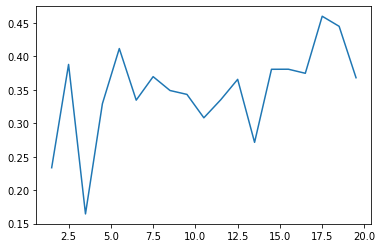

unique =  [ 3  4  5  6  7  8  9 10 11 12 16]
l_uni =  (11,)
      x      y  Nn        Dm        Bf
0 -0.68  35.97   6  0.017251  0.319220
4  6.55  28.84   6  0.008145  0.053835
5 -8.97  21.55   6  0.001978  0.869358


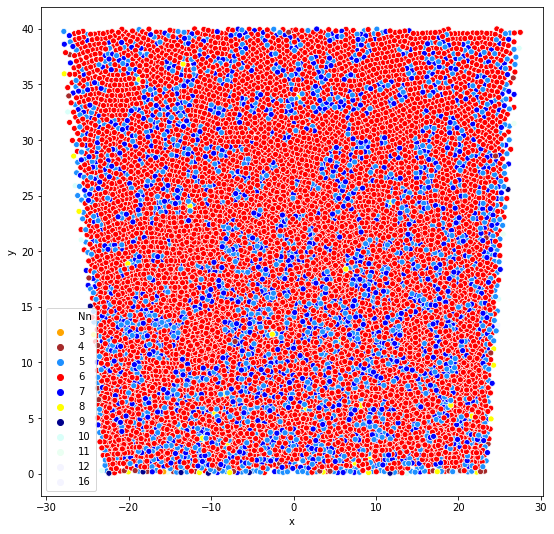

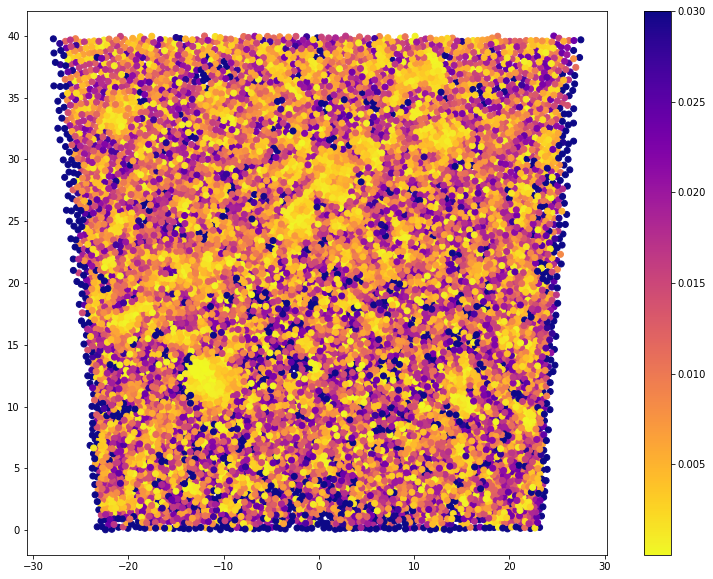

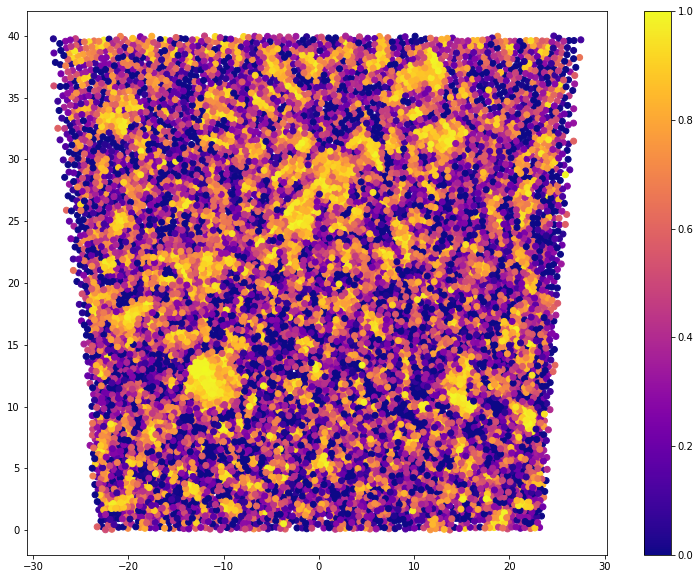

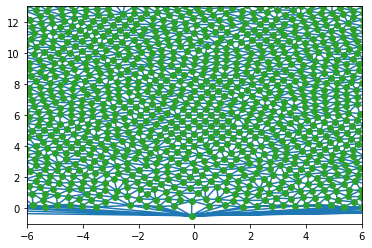

<calculating b = 83.0>
0.016028369895357306
del measure =  0.3251597236265588
[[0.66757839 0.66772672 0.66785354 ... 0.18710421 0.18749686 0.1878475 ]
 [0.66754841 0.66770069 0.66783089 ... 0.18667515 0.18711238 0.18750311]
 [0.66751752 0.66767385 0.66780753 ... 0.1861967  0.18668338 0.18711864]
 ...
 [0.38781729 0.38807304 0.3883437  ... 0.59173495 0.58972774 0.58788254]
 [0.38776757 0.38799797 0.38824077 ... 0.58964733 0.58776985 0.5860469 ]
 [0.38771056 0.38791809 0.38813569 ... 0.58774985 0.58599216 0.58438191]]


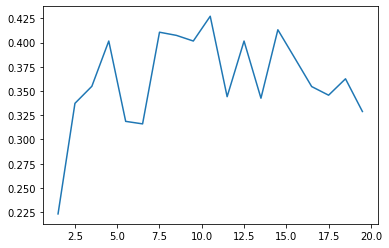

unique =  [ 4  5  6  7  8  9 10 11 13]
l_uni =  (9,)
       x      y  Nn        Dm        Bf
0  23.77  38.90   6  0.027695  0.042569
1   5.37   7.60   6  0.004444  0.932379
4  13.83  16.28   6  0.010151  0.017769


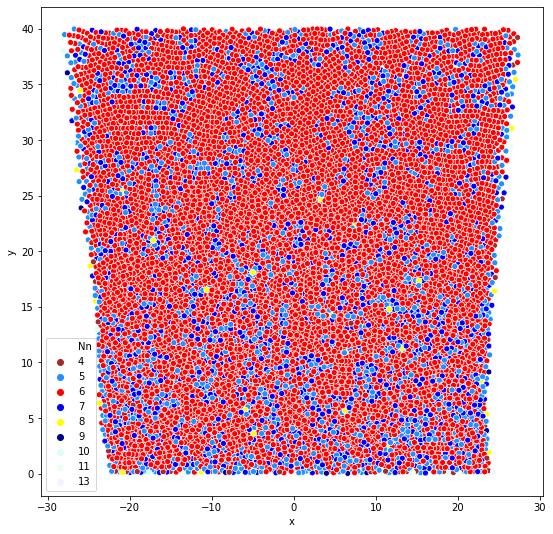

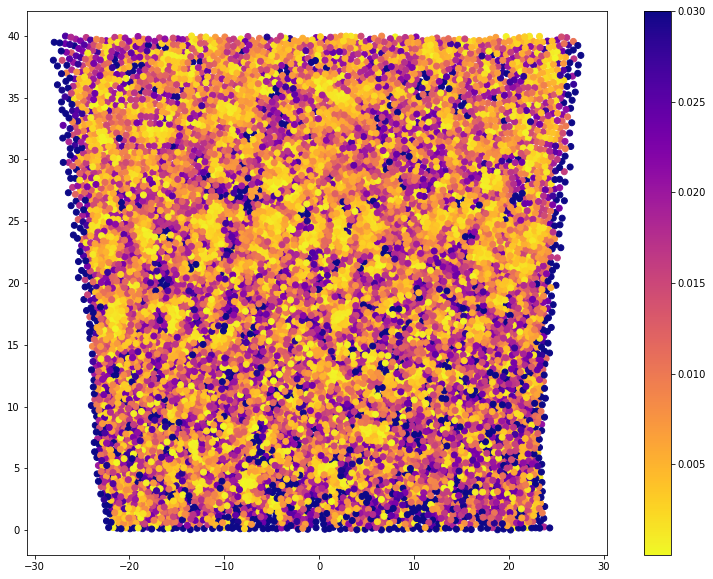

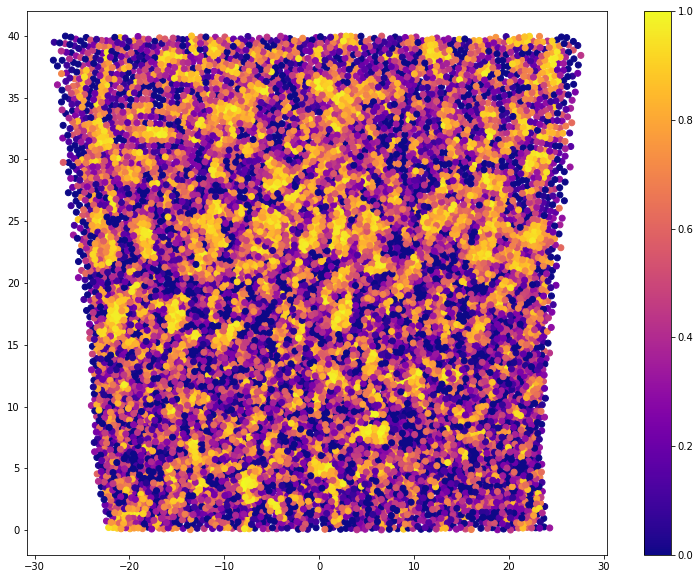

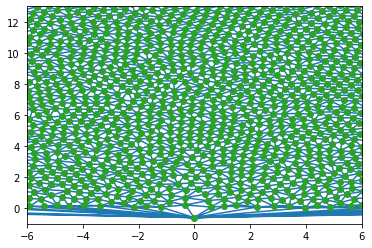

<calculating b = 83.0>
0.006506697112284113
del measure =  0.35779916420224295
[[0.75166579 0.75073351 0.74965883 ... 0.73728519 0.7373168  0.73734978]
 [0.75176134 0.7508437  0.74978578 ... 0.73728033 0.73731197 0.73734493]
 [0.75185537 0.75095215 0.74991072 ... 0.73727499 0.73730661 0.73733951]
 ...
 [0.9477631  0.94819533 0.94858904 ... 0.56917429 0.56669635 0.56446749]
 [0.94731808 0.94775123 0.94814657 ... 0.56711288 0.56482884 0.56277835]
 [0.94684099 0.94727366 0.94766936 ... 0.56506651 0.56297832 0.56110751]]


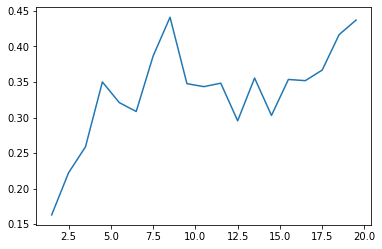

unique =  [ 4  5  6  7  8  9 10 11 12 13]
l_uni =  (10,)
       x      y  Nn        Dm        Bf
0   8.62  21.76   6  0.014095  0.476865
3  -6.19  17.03   6  0.026730  0.546879
5 -14.94  34.12   6  0.003691  0.812389


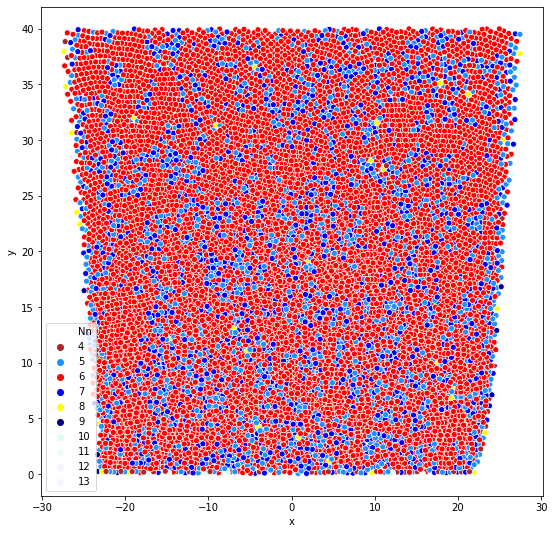

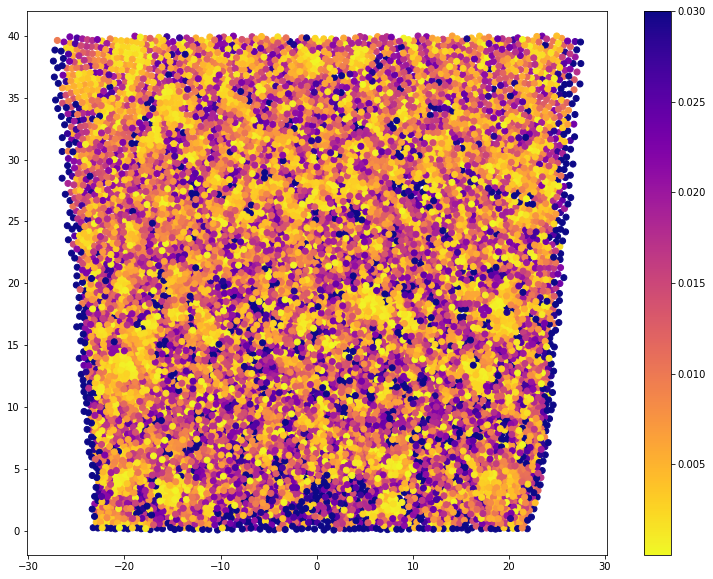

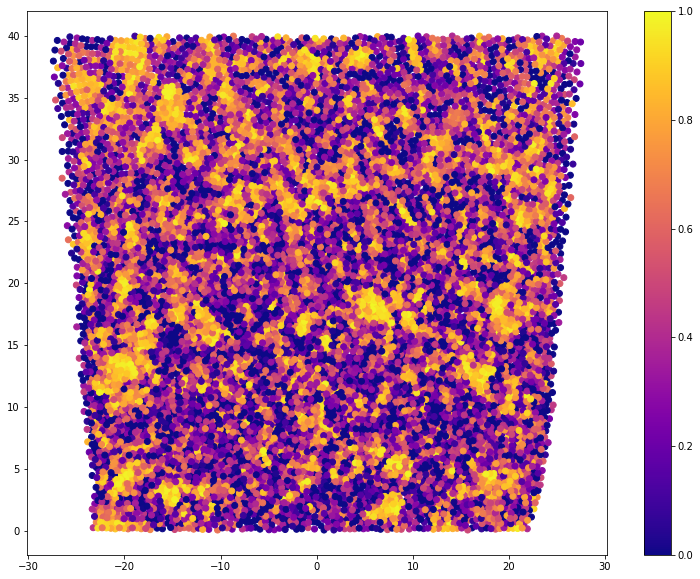

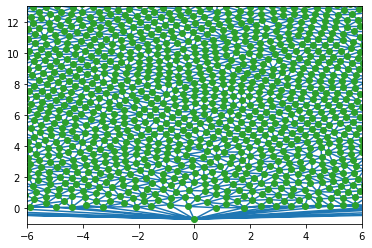

<calculating b = 83.0>
0.008333700066354435
del measure =  0.37053214213476654
[[0.06233208 0.06233201 0.06233201 ... 0.15069961 0.14613753 0.14233173]
 [0.06233221 0.06233214 0.06233213 ... 0.1505452  0.14600876 0.14222478]
 [0.06233236 0.06233228 0.06233227 ... 0.15039253 0.14588151 0.14211914]
 ...
 [0.24751234 0.24744077 0.2473712  ... 0.32835342 0.32843017 0.32833119]
 [0.24814178 0.24807154 0.24800385 ... 0.32320231 0.32329566 0.32319978]
 [0.24869744 0.24862749 0.24856064 ... 0.3176096  0.31771668 0.31762064]]


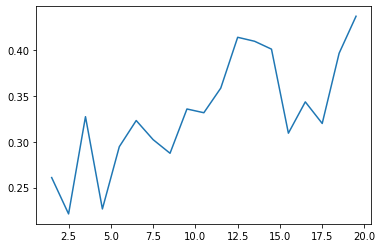

unique =  [ 4  5  6  7  8  9 10 11 12 13]
l_uni =  (10,)
       x      y  Nn        Dm        Bf
1 -17.49  37.50   7  0.023466  0.374126
3  24.14  39.82   6  0.017849  0.045266
5   0.68  15.09   7  0.023786  0.173867


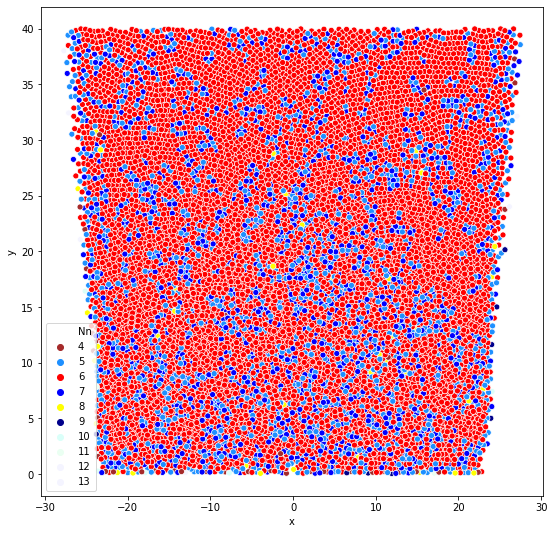

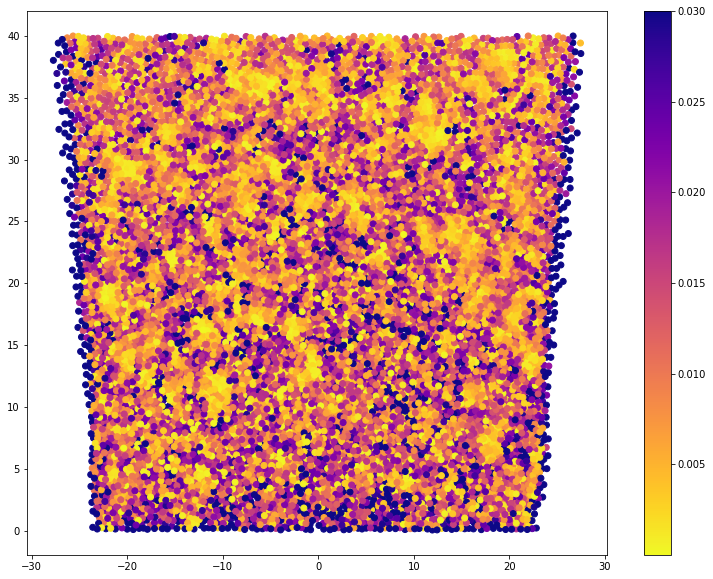

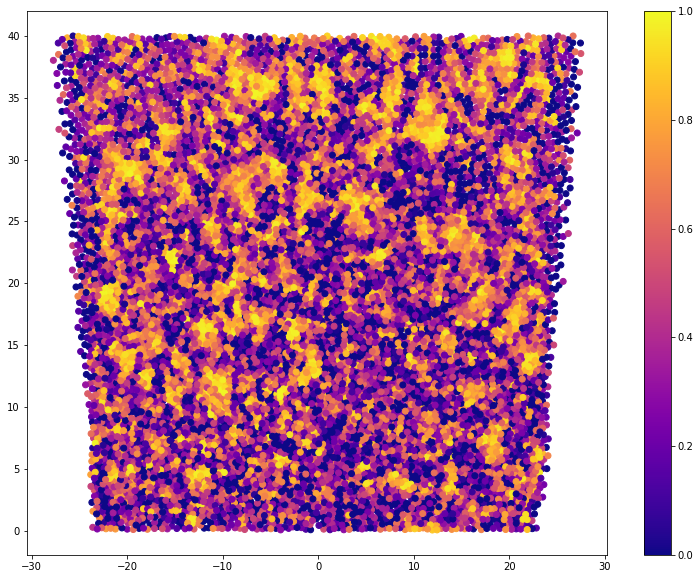

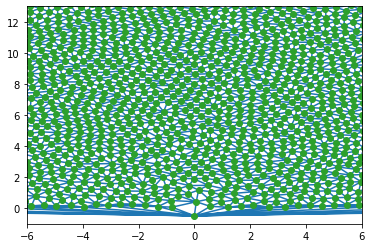

<calculating b = 83.0>
0.0029540179871523175
del measure =  0.41528624488352117
[[0.23466021 0.23498075 0.23525094 ... 0.59247932 0.5925649  0.59266293]
 [0.23456381 0.23489616 0.23517681 ... 0.59247077 0.59255512 0.59265176]
 [0.23445897 0.23480383 0.2350956  ... 0.59246244 0.59254557 0.59264083]
 ...
 [0.24579329 0.25196649 0.25789168 ... 0.85160881 0.85210318 0.8525282 ]
 [0.24441742 0.25063932 0.25662635 ... 0.85164765 0.85213701 0.8525573 ]
 [0.24302184 0.24928866 0.25533444 ... 0.85166569 0.85215111 0.85256764]]


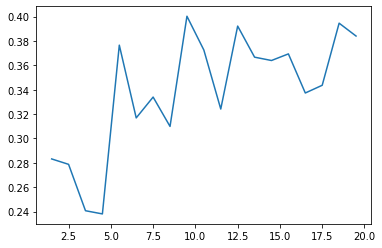

unique =  [ 4  5  6  7  8  9 10 11 12 13 16]
l_uni =  (11,)
       x     y  Nn        Dm        Bf
0  10.52  14.6   6  0.006853  0.798263
3 -13.13  14.4   6  0.006358  0.914621
4  18.57   4.5   6  0.008066  0.451269


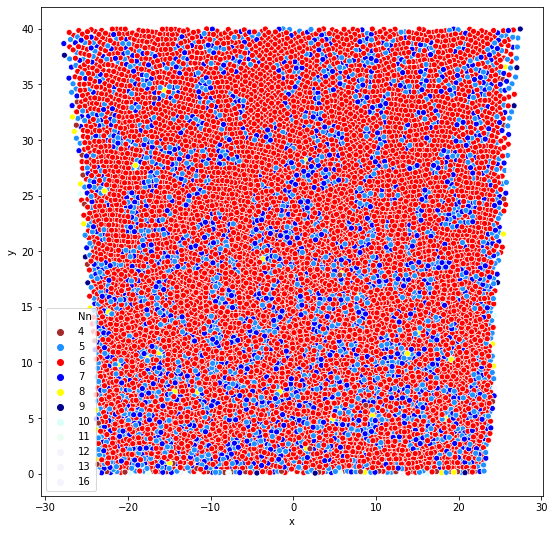

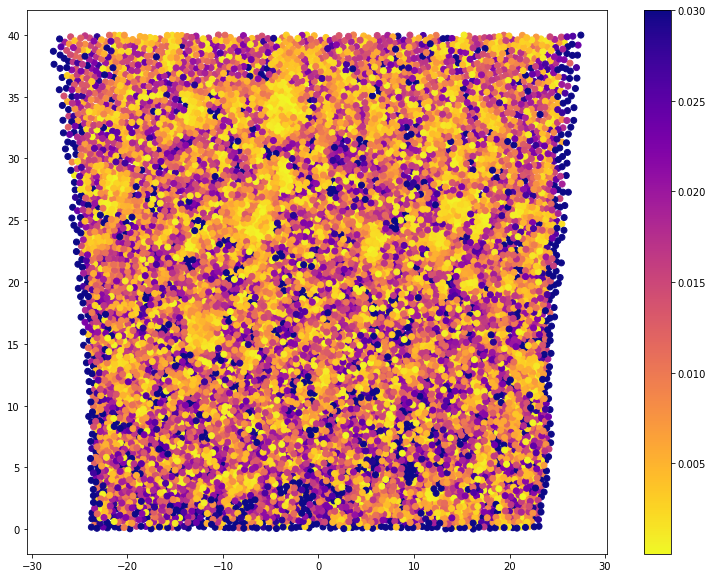

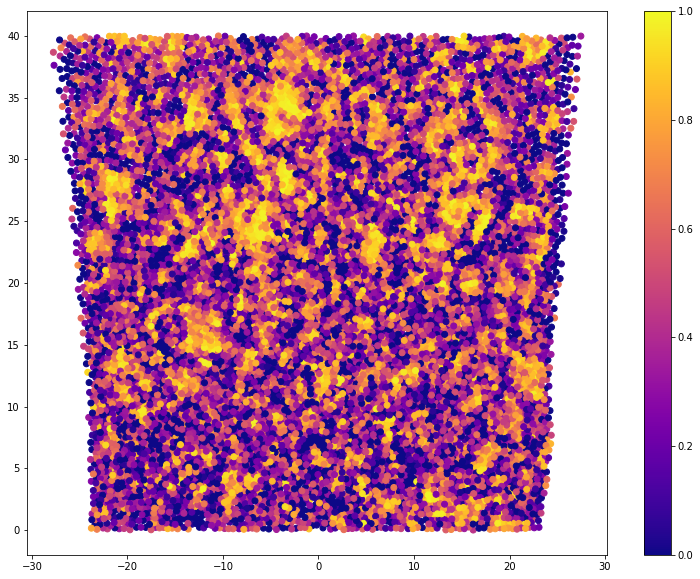

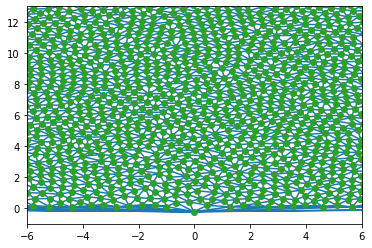

<calculating b = 83.0>
0.008237052435540305
del measure =  0.3728685456092036
[[0.15677957 0.15775134 0.15886735 ... 0.53951371 0.53953718 0.53955851]
 [0.15672059 0.15768344 0.15878929 ... 0.53948794 0.53951406 0.5395378 ]
 [0.15666233 0.15761634 0.15871213 ... 0.53945926 0.53948834 0.53951476]
 ...
 [0.30842477 0.32015468 0.33283546 ... 0.10976544 0.10994358 0.11014882]
 [0.30458664 0.31607386 0.32851445 ... 0.10950517 0.10967112 0.10986273]
 [0.30067069 0.31189356 0.32407026 ... 0.10927451 0.10942922 0.10960822]]


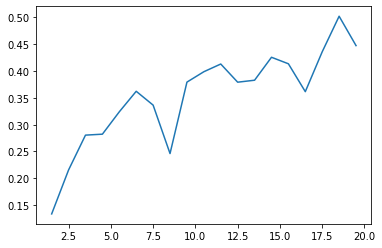

unique =  [ 4  5  6  7  8  9 10 11 14 16]
l_uni =  (10,)
       x      y  Nn        Dm        Bf
0 -12.24  16.20   6  0.018213  0.170861
1   2.14  25.01   6  0.010457  0.715429
2  -8.09   4.95   6  0.016173  0.362183


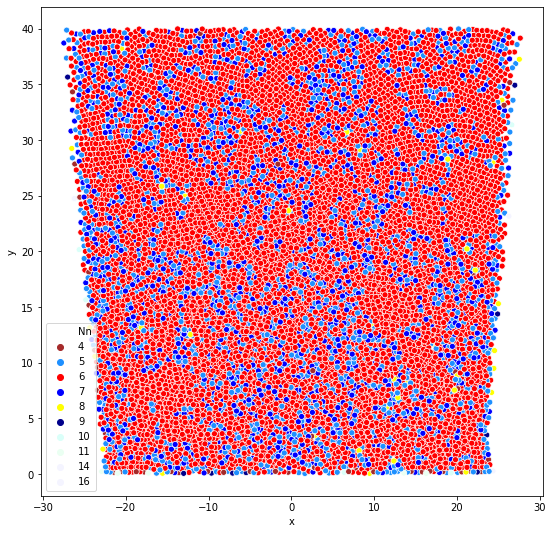

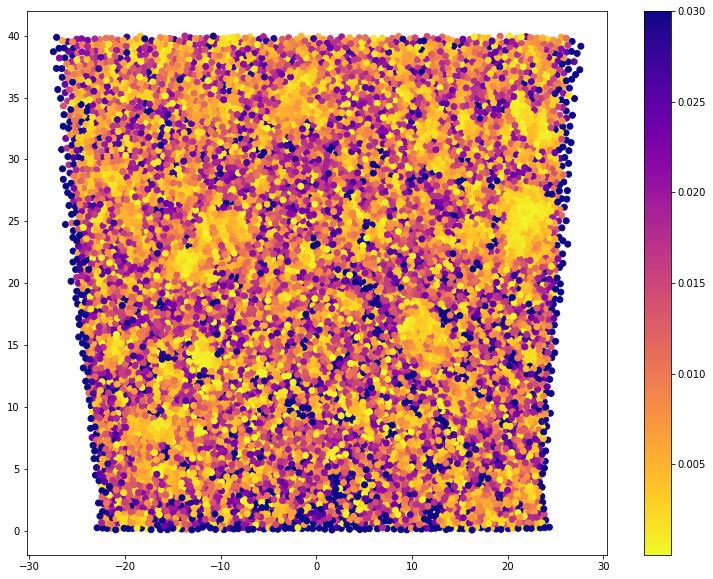

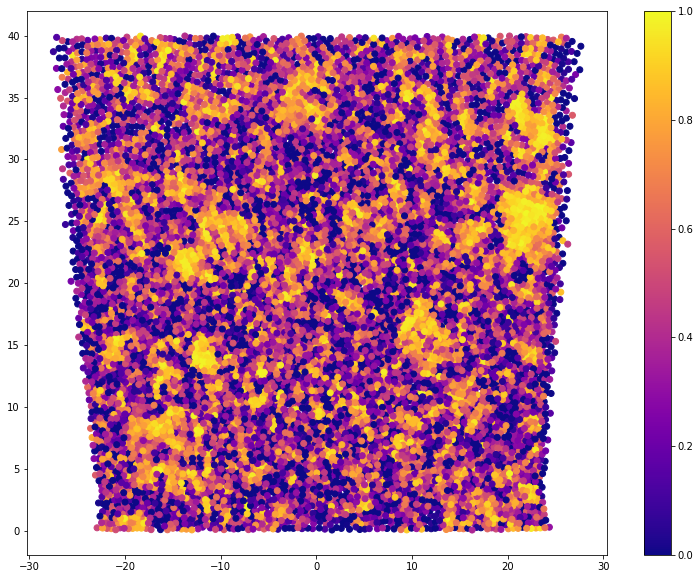

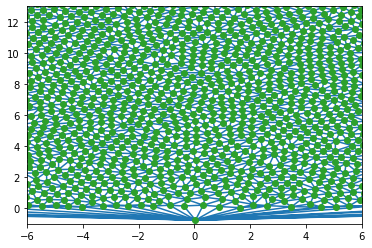

<calculating b = 83.0>
0.008715582656904976
del measure =  0.3194753251898873
[[0.23842783 0.23846682 0.23849945 ... 0.7004515  0.70048162 0.7005173 ]
 [0.23842544 0.23846469 0.23849754 ... 0.70044586 0.70047582 0.70051133]
 [0.23842291 0.23846243 0.23849549 ... 0.70043931 0.70046906 0.70050435]
 ...
 [0.01107068 0.0106883  0.01037003 ... 0.37997081 0.37387194 0.36723667]
 [0.01162051 0.01121602 0.01087976 ... 0.38128291 0.37518091 0.36853366]
 [0.01224213 0.01181281 0.01145631 ... 0.38242877 0.3763245  0.36966724]]


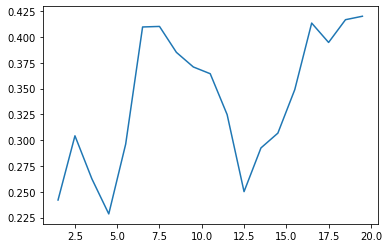

unique =  [ 3  4  5  6  7  8  9 10 11 12 13 14 15 16]
l_uni =  (14,)
      x      y  Nn        Dm        Bf
0 -6.51  25.88   6  0.017852  0.151219
1  9.92  10.08   6  0.011511  0.714753
3 -7.33   5.80   6  0.003728  0.794429


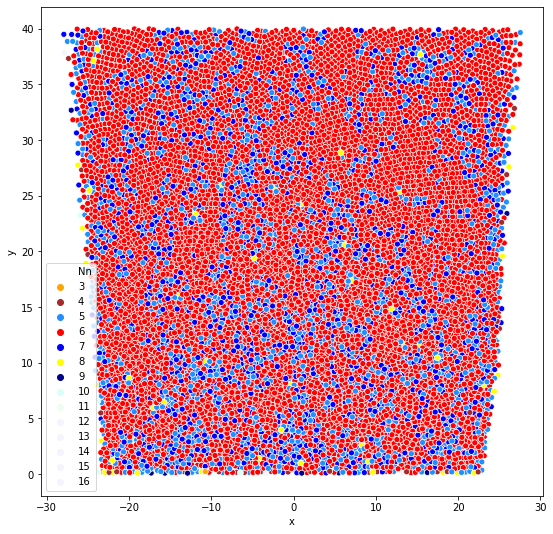

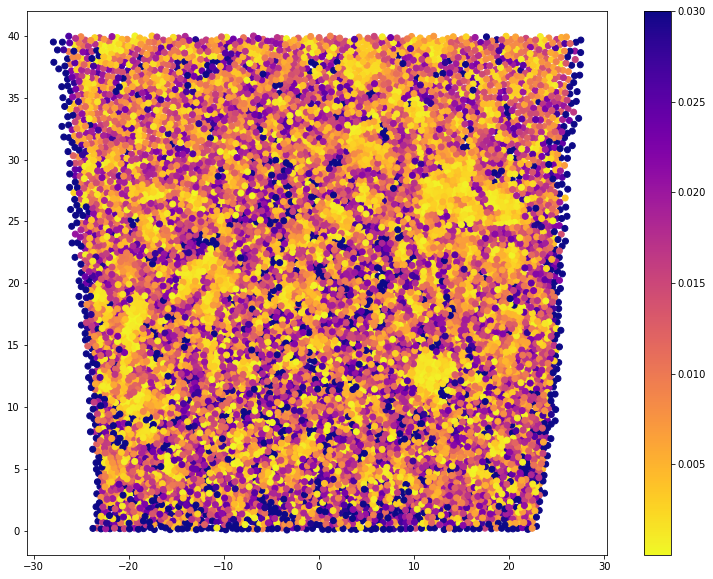

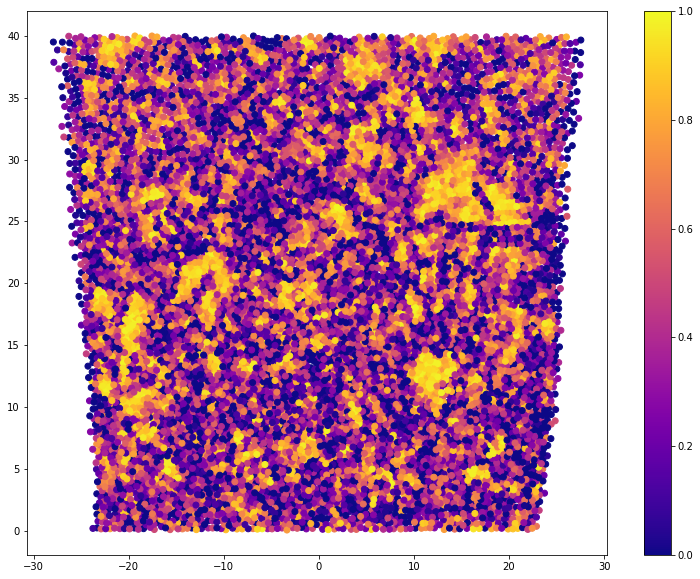

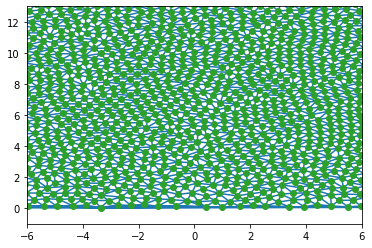

<calculating b = 83.0>
0.006190703284612091
del measure =  0.32382109495511446


In [ ]:
col = ["FR","X","Y"]
#col = ["id" ,"frame", "x/cm", "y/cm"]

blist = 2 * lin_var[test_var]
v_0_list = []
from itertools import groupby
N_del_i = 10
N_del = 10
fps = 16
for T_test in T_test_list[0:1]:
    folder_frame_frac = np.array(folder_frame.loc[folder_frame[test_str2] == T_test]['ini_folder'])
    b_folder = np.array(folder_frame.loc[folder_frame[test_str2] == T_test]['b'])
    loc_list = [[path + folder + sl + "stitch_new_evac_traj_" + af.b_data_name(2 * bi, 3) + "_" + str(i) + ".txt" for i in
                 range(N_runs)] for folder, bi in zip(folder_frame_frac, b_folder)]
    bi = 0
    bond_array_1 = []
    del_m_array_1 = []
    order_matrix_2 = []
    for loc_list_runs in loc_list[0:10]:
        print("<calculating " + test_str + " = " + str(2 * lin_var[test_var][bi]) + ">")
        p0count = 0
        count = 0
        incount = 0
        bond_array = []
        del_m_array = []
        order_matrix_1 = [] 
        for loc in loc_list_runs:
            if os.path.isfile(loc) == False:
                #print("WARNING: file " + loc + " not found.")
                continue
            df = pd.read_csv(loc, sep="\s+", header=0, comment="#",skipinitialspace=True, usecols=col)
            #df = pd.read_csv("exp_results/trajectories/sieben.txt", header=0, comment="#",skipinitialspace=True, sep = " ")
            #df = pd.read_csv("trajectories/ini_lm_N_ped20000_tmax300_size_0_2_fps_16_testvar_b/ini_41_6_lm_20000_esigma_0_7_tmax_300_periodic_0_v0_1_34_T_1_0_rho_ini_2_0_Nped_20000_0_motfrac_1_0/stitch_new_evac_traj_83_2_0.txt", sep="\s+", header=0, comment="#",skipinitialspace=True, usecols=col)
            #df = pd.DataFrame({'X':df['x/m'].values/100,'Y':df['y/m'].values/100,"FR":df['frame'].values})
            #print(df)
            del_m_list = []
            bond_list = []
            #time_list = [0,1,2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,80,98,99,90,91]
            #time_list = np.arange(0,300,1)
            #time_list = np.arange(0,300,150)
            time_list = np.array([150])
            for second in time_list:
                x = df[df['FR'] == second * fps]['X'].values#/100
                y = df[df['FR'] == second * fps]['Y'].values#/100
                #x = df['X']
                #y = df['Y']
                #x,y = hexagonalLattice(100,1,second,-1,1,1)
               
                XY = pd.DataFrame({'x':x,'y':y})
                #XY = XY[XY['x'] ** 2 + XY['y'] ** 2 < 10**2]
                x = XY['x'].values
                y = XY['y'].values
                

                """h_list = np.arange(-3,30,1)
                k_list = np.arange(-0,30,1)
                l_list = np.arange(-1,30,1)
                data_name = 'fcc'"""

                #x = np.array([h + l* 1/2 for h in h_list for k in k_list for l in l_list])
                #y = np.array([k + l* 1/2 for h in h_list for k in k_list for l in l_list])
                #x = np.array([h/2 - 1/2 * l for h in h_list for l in l_list])
                #y = np.array([m.sqrt(3)/2 * h + m.sqrt(3)/2 * l for h in h_list for l in l_list])

                points = np.vstack((x,y)).T
                tri = Delaunay(points)
                
                
                dist_tri,dist = latticeDistance(tri)
                unique, counts = np.unique(tri.simplices, return_counts=True)
                #print(counts)
                #print(pd.DataFrame({"neigh":unique, "count":counts}))
                #plt.hist(counts,bins=range(1, 10), density = True)
                #plt.show()
                nphist = np.histogram(counts,density = True,bins=range(1, 10))
                #plt.plot(nphist[1][:-1],nphist[0], marker = "o", linestyle='none')
                #plt.show()
                N = x.shape[0]
                neighbour_list = []
                neigh_dist_list = []
                local_bond_list = []
                for p_index in range(N):
                    neigh_dist = indexDistance(p_index,tri)
                    neigh = find_neighbors(p_index,tri)
                    neighbour_list.append(len(neigh))
                    neigh_dist_list.append(neigh_dist.var()/neigh_dist.mean()**2)
                    local_bond_list.append(localBondOrientationFactor(p_index,tri))
                XY['Nn'] = neighbour_list
                XY['Dm'] = neigh_dist_list
                XY['Bf'] = local_bond_list

                dist = indexDistance(0,tri)
                print(dist.var()/dist.mean())
                bond_measure = bondOrientationFactor(tri,N)
                bond_list.append(bond_measure)


                dist_tri = np.round(dist_tri,3)
                dist = np.array(dist)
                dist = np.round(dist,3)
                
                del_m = delHexMeasure(dist_tri,dist)
                print("del measure = ", del_m)

                del_m_list.append(del_m)
                #unique, counts = np.unique(dist, return_counts=True)
                #dist = np.histogram(dist,bins = 100,density = True)
                #x_l = XY[XY['x'] ** 2 + (XY['y'] - 15) ** 2 < 5 ** 2 ]['x'].values
                #y_l = XY[XY['x'] ** 2 + (XY['y'] - 15) ** 2 < 5 ** 2 ]['y'].values
                #y_l = (random.rand(300)) * 10 + 50
                #x_l = (random.rand(300)) * 10 -5
                #lat_x.append(x_l)
                #lat_y.append(y_l)
                
                #print(x_l.shape)
                x_array = np.linspace(-20,20,8000)
                y_array = np.linspace(0,20,4000)

                #x_arr = [x_array for i in range(1)]
                #y_arr = [y_array for i in range(1)]

                #r_array = np.linspace(0,2,5)
                #phi_array = np.linspace(0,2 * 3.1415,100)
                #g_r_phi = cff.correlation_data(np.array([x_l]),np.array([y_l]),x_arr,y_arr,r_array,phi_array,0.15)
                XY_red = XY[XY['Nn'] < 11]
                XY_red = XY[XY['x'] < 40]
                XY_red = XY_red[XY_red['x'] > -40]
                XY_red = XY_red[XY_red['y'] < 40]
                XY_red = XY_red[XY_red['y'] > 0]
                XY20 = XY_red[XY_red['x'].values ** 2 + XY_red['y'].values ** 2 < 20 ** 2]
                #y = XY[XY['x'].values ** 2 + XY['y'].values ** 2 < 20 ** 2]['y'].values
                order_matrix = orderField(XY_red['x'].values,XY_red['y'].values,XY_red['Bf'].values,x_array,y_array,0.175)
                order_matrix_1.append(order_matrix)
                
                #normal_matrix = normal(XY_red['x'].values,XY_red['y'].values,x_array,y_array,0.175)
                radius = []
                Dm_list = []
                print(order_matrix)
                for r in np.arange(1,20):
                    XYRing = XY20[XY20['x'].values ** 2 + XY20['y'].values ** 2 < (r+1) ** 2]
                    XYRing = XYRing[XYRing['x'].values ** 2 + XYRing['y'].values ** 2 > r ** 2]
                    radius.append(r + 0.5)
                    Dm = XYRing['Bf'].values.mean()
                    Dm_list.append(Dm)
                plt.plot(radius,Dm_list)
                plt.show()
                
                unique, counts = np.unique(XY_red['Nn'].values, return_counts=True)
                print("unique = ", unique)
                print("l_uni = ", unique.shape)
                gapminder = XY_red
                print(gapminder.head(3))
                #gapminder=gapminder[gapminder.year.isin([2002,1962])]
                #äpalette=["#fdeb40",'green','orange','brown','dodgerblue','red','blue','yellow','darkblue',]
                fig, ax = plt.subplots(figsize = (9, 9))

                g =sns.scatterplot(x="x", y="y",
                              hue="Nn",
                              data=gapminder,palette = color_dict);
                g.set()

                plt.savefig(path + "plots/structure/neigh" + str(second) + ".png")
                plt.show()
                #sns.color_palette("coolwarm")
                #g =sns.scatterplot(x="x", y="y",
                 #             hue="Dm",
                  #            data=gapminder);
                fig, ax = plt.subplots(figsize = (13, 10))
                cm = plt.cm.get_cmap('plasma_r')

                sc = plt.scatter(gapminder['x'].values,gapminder['y'].values, c = gapminder['Dm'].values, cmap=cm,vmax = 0.03)
                fig.colorbar(sc)
                plt.savefig(path + "plots/structure/dist_factor/dist" + str(second) + ".png")
                #g.set()
                plt.show()
                fig, ax = plt.subplots(figsize = (13, 10))
                cm = plt.cm.get_cmap('plasma')
                sc = plt.scatter(gapminder['x'].values,gapminder['y'].values, c = gapminder['Bf'].values, cmap=cm,vmax = 1,vmin = 0)
                fig.colorbar(sc)
                plt.savefig(path + "plots/structure/bond_factor/dist" + str(second) + ".png")
                #g.set()
                plt.show()
                #print(dist)
                #plt.hist(dist)
                #print("plt.plotdist")
                #plt.plot(dist[1][:-1],dist[0], marker = "o", linestyle='none')
                #plt.xlim([-2,2])
                #plt.yscale("log")
                #plt.xscale("log")

                #plt.show()
                #print(tri)
                plt.xlim([-6,6])
                plt.ylim([-1,13])
                plt.triplot(points[:,0], points[:,1], tri.simplices)
                plt.plot(points[:,0], points[:,1], 'o')
                plt.show()
            del_m_array.append(np.array(del_m_list))
            bond_array.append(np.array(bond_list))
        order_matrix_2.append(order_matrix_1)
        del_m_array_1.append(del_m_array)
        bond_array_1.append(bond_array)
    """plt.plot(time_list,del_m_array_1)
    plt.show()
    plt.plot(time_list,bond_list_1)
    plt.show()"""

(10, 1, 4000, 8000)


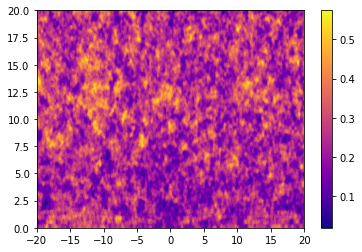

In [282]:
#plt.plot(time_list,np.array(del_m_array_1).mean(axis=1).mean(axis=0))
#plt.xscale('log')
#plt.yscale('log')

#plt.show()
#plt.plot(time_list,np.array(np.array(bond_array_1).mean(axis=1).mean(axis=0)))
#plt.show()
#print(np.array(del_m_array_1).mean(axis=1).mean(axis=0))
print(np.array(order_matrix_2).shape)

ordermatrix = np.array(order_matrix_2).mean(axis=1).mean(axis=0)[:-1, :-1]
x_heat = x_array
y_heat = y_array
z_min, z_max = ordermatrix.min(), ordermatrix.max()

fig, ax = plt.subplots()

c = ax.pcolormesh(x_heat, y_heat, ordermatrix, cmap='plasma', vmin=z_min, vmax=z_max)
# set the limits of the plot to the limits of the data
ax.axis([x_heat.min(), x_heat.max(), y_heat.min(), y_heat.max()])
fig.colorbar(c, ax=ax)
plt.show()

#print(xymesh)
#r = np.sqrt(x_heat**2 + y_heat**2)
#plt.plot(r,ordermatrix.flatten())
 

0.2535427586718877


/Users/jonas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice.
  # This is added back by InteractiveShellApp.init_path()


             r     order
0         20.0  0.176163
1         20.0  0.175656
2         20.0  0.175257
3         20.0  0.174951
4         20.0  0.174718
...        ...       ...
31999995  28.3  0.251582
31999996  28.3  0.253965
31999997  28.3  0.256317
31999998  28.3  0.258624
31999999  28.3  0.260873

[32000000 rows x 2 columns]


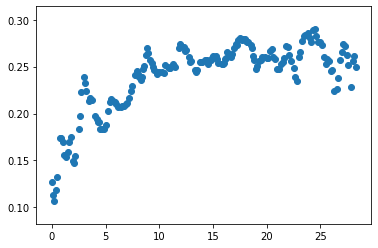

In [285]:
xymesh = np.meshgrid(x_heat,y_heat)
x_r = np.round(xymesh[0].flatten(),1)
y_r = np.round(xymesh[1].flatten(),1)
print(np.array(order_matrix_2).mean())
orderlist = np.array(order_matrix_2).mean(axis=1).mean(axis=0).flatten()
r = np.round(np.sqrt(x_r ** 2 + y_r ** 2),1)
orderframe = pd.DataFrame({'r':r, 'order':orderlist})
new_r = np.arange(0,40,0.1)
ordermean = []
for r in new_r:
    ordermean.append(orderframe[orderframe['r'] == r]["order"].values.mean())
    
print(orderframe)
plt.scatter(new_r,ordermean)

           x      y  Nn        Dm        Bf
6      -7.53  14.87   7  0.015431  0.083554
9     -17.23   5.29   7  0.026529  0.301950
13     11.30   7.54   5  0.008245 -0.083547
19     -2.51   0.24   4  0.000106  0.322380
20      0.35  16.22   6  0.003587  0.785333
...      ...    ...  ..       ...       ...
19512 -14.70   0.44   5  0.004646  0.153391
19514 -19.27   4.84   7  0.033937  0.204200
19515 -15.33   7.34   6  0.008867  0.267960
19516  -5.98  16.09   6  0.005215  0.883106
19518  -8.33  15.91   7  0.016342  0.534471

[3792 rows x 5 columns]


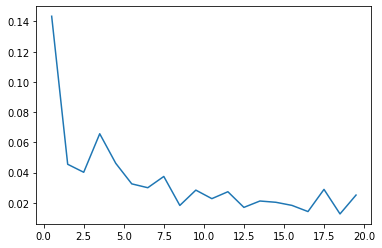

In [177]:
XY20 = XY[XY['x'].values ** 2 + XY['y'].values ** 2 < 20 ** 2]
#y = XY[XY['x'].values ** 2 + XY['y'].values ** 2 < 20 ** 2]['y'].values
print(XY20)
radius = []
Dm_list = []
for r in np.arange(0,20):
    XYRing = XY[XY['x'].values ** 2 + XY['y'].values ** 2 < (r+1) ** 2]
    XYRing = XYRing[XYRing['x'].values ** 2 + XYRing['y'].values ** 2 > r ** 2]
    radius.append(r + 0.5)
    Dm = XYRing['Dm'].values.mean()
    Dm_list.append(Dm)
plt.plot(radius,Dm_list)

    

In [68]:
pi = 3.1415926535897932384626433832795028841971693993751058209749445923
mu = 1
noise_rand = np.random.rand(5) * mu
cos_sum = 0
for noise in noise_rand:
    print(noise)
    cos_sum += m.cos(6 * (pi/6 + noise))
print(1/5 * cos_sum)
    

0.3752549324113289
0.6903091429149798
0.9409317012988536
0.30668014851488523
0.6520225933237844
0.26989790428739163


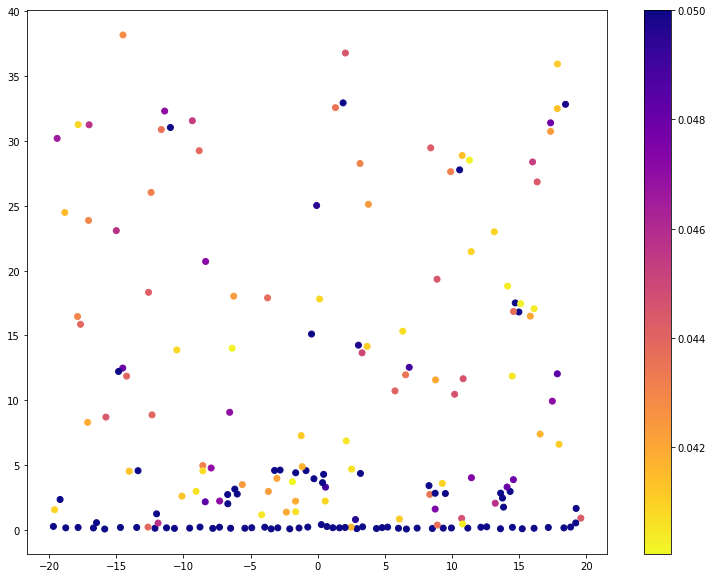

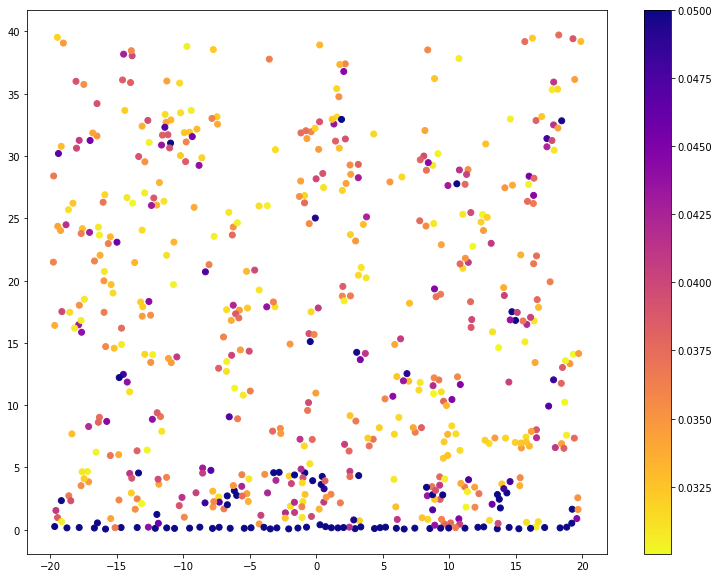

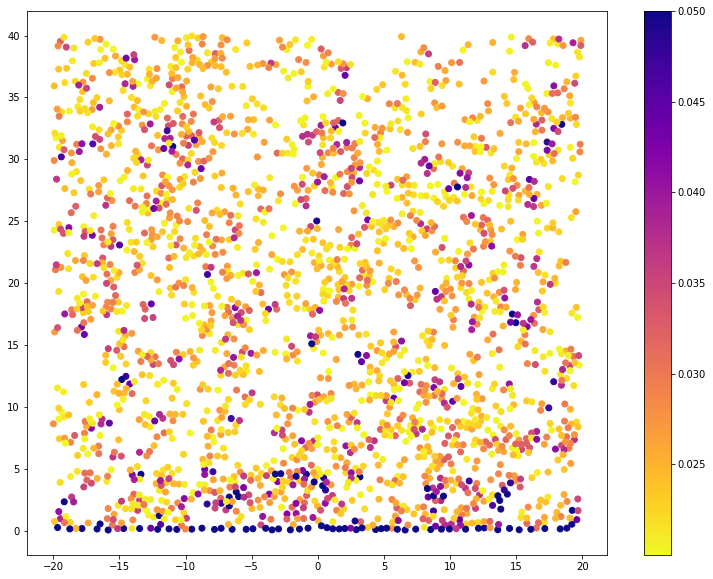

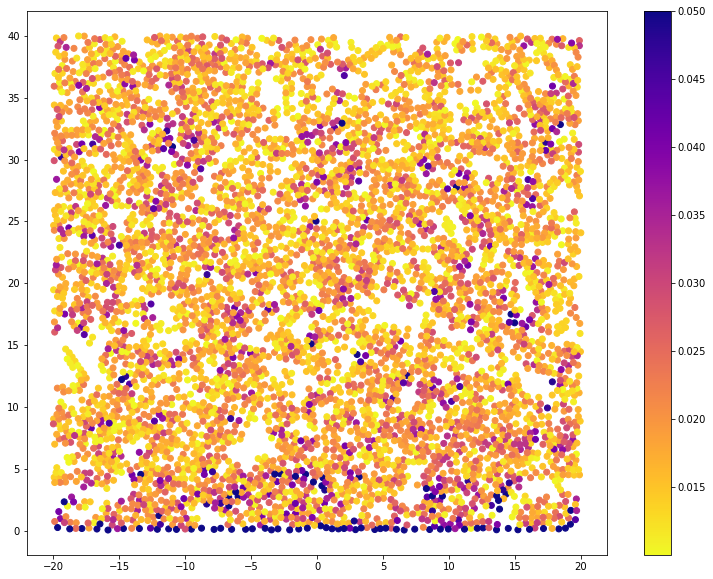

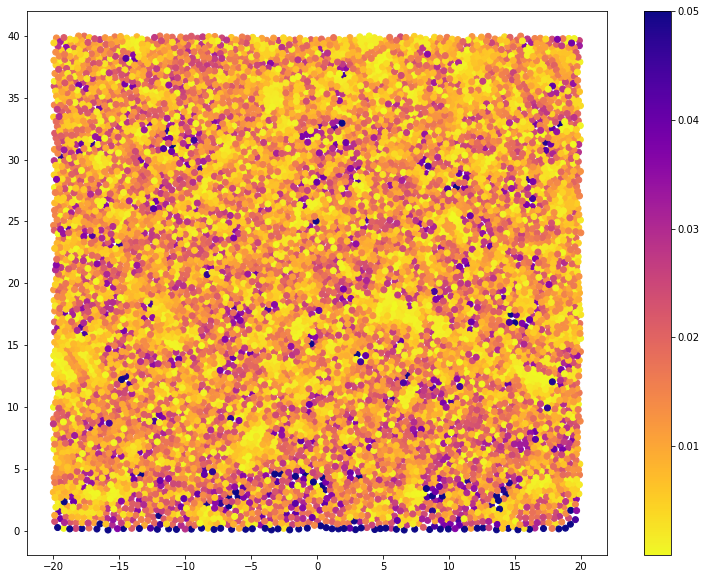

In [50]:
os.system("mkdir " + path + "plots/structure/filtartion")
for filtration in reversed(np.arange(0,0.05,0.01)):
    filtered = gapminder[gapminder['Dm'] > filtration]
    fig, ax = plt.subplots(figsize = (13, 10))

    cm = plt.cm.get_cmap('plasma_r')
    sc = plt.scatter(filtered['x'].values,filtered['y'].values, c = filtered['Dm'].values, cmap=cm,vmax = 0.05)
    fig.colorbar(sc)
    plt.savefig(path + "plots/structure/filtartion/filter" + str(filtration) + ".png")
    plt.show()

In [ ]:
f_score = {spot: float("inf") for row in grid for spot in row}